<a href="https://colab.research.google.com/github/maitb-ss/social-media-analytics/blob/master/001_covid19_and_vaccine_information_spread.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Covid-19 and Vaccine Information Spread in Indonesia**

Coronavirus disease 2019 (COVID-19) is an infectious disease caused by severe acute respiratory syndrome coronavirus 2 (SARS-CoV-2). It was first identified in December 2019 in Wuhan, Hubei, China, and has resulted in an ongoing pandemic. The first confirmed case has been traced back to 17 November 2019 in Hubei.As of 6 August 2020, more than 18.7 million cases have been reported across 188 countries and territories, resulting in more than 706,000 deaths. More than 11.3 million people have recovered.

Until now, a vaccine for this disease has not been found. However, lately a lot of parties have started to raise rumors about the issue of vaccine findings.

Most of the people today share opinions and information about COVID-19 vaccine through various social media, including Twitter. 

## **A. Collecting Twitter Data**

To collect twitter data in python, we can use Tweepy. Tweepy is the most popular Python Package for accessing the Twitter API, You can read the full documentation [HERE](https://tweepy.readthedocs.io/en/latest/). In this practice, we will practice to get tweet data using a specific keyword and save it as .CSV files

**Install & Import Libraries**

In [ ]:
# Install Library
!pip install tweepy

In [ ]:
# Import Libraries
import tweepy
import pandas as pd
import numpy as np
import sys
import csv

**Set API Key**

In [ ]:
# Fill the API Key
consumer_key = 'V6ecyXIMwnIMNSwkL2Aufh7kn'
consumer_secret = 'CZso5Sq8lSGC3fNntvli3YYJk5xZIQpuT6nJrgaqIBRPqY2Z6M'
access_token = '159365416-TMpXIVMZQvIMCXcG8kBuPes8P9Bx7Dnv2LEJJc4P'
access_token_secret = 'IVHB1ftl2vJTvqdRPDlePABIwUHmX2yhAZe5YQ9z01gSU'

# Auth. 
auth = tweepy.OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_token_secret)
api = tweepy.API(auth)
api

**Set Tweet Requirements**

In [ ]:
# Set Word to Follow
keyword = 'covid'

# Set Number of Tweets
number_of_tweets = 100

# Tweet Mode
tweet_mode = 'extended'

# Set Language
language = 'id'

**Get the Tweets**

In [ ]:
# Finding Tweets by Keyword
crawling_keyword = api.search(keyword, count=number_of_tweets, tweet_mode = tweet_mode, lang=language)

# Show Tweets
crawling_keyword

[Status(_api=<tweepy.api.API object at 0x7f03aef83ef0>, _json={'created_at': 'Fri Sep 11 07:23:29 +0000 2020', 'id': 1304319637929119744, 'id_str': '1304319637929119744', 'full_text': 'RT @geloraco: Uji Coba Vaksin Covid-19 Dihentikan Sementara Waktu, Relawan Alami Peradangan Langka\nhttps://t.co/fk5IQ50WET', 'truncated': False, 'display_text_range': [0, 122], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'geloraco', 'name': 'GELORA NEWS', 'id': 3319260420, 'id_str': '3319260420', 'indices': [3, 12]}], 'urls': [{'url': 'https://t.co/fk5IQ50WET', 'expanded_url': 'https://www.gelora.co/2020/09/uji-coba-vaksin-covid-19-dihentikan.html', 'display_url': 'gelora.co/2020/09/uji-co…', 'indices': [99, 122]}]}, 'metadata': {'iso_language_code': 'in', 'result_type': 'recent'}, 'source': '<a href="http://twitter.com/download/android" rel="nofollow">Twitter for Android</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None

**Transform Tweets to Dataframe**

In [ ]:
# Create Tweets Data Frame
df_crawling_keyword = pd.DataFrame({
                      'time' : [tweet.created_at for tweet in crawling_keyword],
                      'description' : [tweet.user.description for tweet in crawling_keyword],
                      'usertweets' : [tweet.user.statuses_count for tweet in crawling_keyword],
                      'source' : [tweet.user.screen_name for tweet in crawling_keyword],
                      'target' : [tweet.in_reply_to_screen_name for tweet in crawling_keyword],
                      'verified' : [tweet.user.verified for tweet in crawling_keyword],
                      'text' : [tweet.full_text for tweet in crawling_keyword],
                      'hashtags' : [tweet.entities['hashtags'] for tweet in crawling_keyword],
                      'location' : [tweet.user.location for tweet in crawling_keyword],
                      'following' : [tweet.user.friends_count for tweet in crawling_keyword],
                      'followers' : [tweet.user.followers_count for tweet in crawling_keyword],
                      'retweets' : [tweet.retweet_count for tweet in crawling_keyword],
                      })

df_crawling_keyword

,time,description,usertweets,source,target,verified,text,hashtags,location,following,followers,retweets
0,2020-09-11 07:23:29,jangan pilih yg boneka,9313,aseprahmat4,None,False,RT @geloraco: Uji Coba Vaksin Covid-19 Dihenti...,[],,469,565,33
1,2020-09-11 07:23:29,,1899,polsekwonodadi1,humasres_blikot,False,@humasres_blikot ayo wujudkan #PilkadaSehatTaa...,"[{'text': 'PilkadaSehatTaati3M', 'indices': [3...",,25,10,0
2,2020-09-11 07:23:28,Pencinta Rindu. jika kamu sudah membuat nyaman...,113783,_khasmah,None,False,"Gara-gara politik, rakyat yang pada mati karen...",[],Pekanbaru,838,718,0
3,2020-09-11 07:23:28,"• 『 𝕀𝕗 𝕪𝕠𝕦 𝕔𝕒𝕟’𝕥 𝕣𝕖𝕤𝕡𝕖𝕔𝕥, 𝕕𝕠𝕟’𝕥 𝕖𝕧𝕖𝕟 𝕠𝕡𝕖𝕟 𝕪𝕠𝕦𝕣...",15793,namunymous69,None,False,RT @tubirfess: 2beer! harga segini termasuknya...,[],Namjoon official wife •᷄⌓•᷅,445,243,74
4,2020-09-11 07:23:26,lagi belajar:),27,cutsalmahnf,None,False,RT @watchdoc_ID: Rumah Sakit Darurat Covid-19 ...,[],"Kota Banda Aceh, Indonesia",82,37,728
...,...,...,...,...,...,...,...,...,...,...,...,...
89,2020-09-11 07:22:03,YOU'LL NEVER WALK ALONE,28562,rocilvanpokeng,None,False,RT @AdhieMassardi: MenBUMN CERDAS 》semula bany...,[],,1574,1260,148
90,2020-09-11 07:22:03,"I'm not ok, but it's ok.",6786,ssobri30,None,False,Baru ingat nak balik kampung next week. Dah co...,[],Langkawi . Malacca,144,1421,0
91,2020-09-11 07:22:02,asyik aja,123,Boedhy771,CNNIndonesia,False,@CNNIndonesia Kabar obat covid kok menghilang ya,[],,115,5,0
92,2020-09-11 07:22:01,,42130,edwin_basuki,None,False,RT @Ayang_Utriza: Negara-2 Eropa sdh berencana...,[],"Cibinong, Indonesia",679,312,3


**Save Tweets**

In [ ]:
# Save as .CSV
df_crawling_keyword.to_csv('crawling_keyword.csv')

## **B. Social Network Analysis: Covid-19**

Network theory is the study of graphs as a representation of either symmetric relations or asymmetric relations between discrete objects. In computer science and network science, network theory is a part of graph theory: a network can be defined as a graph in which nodes and/or edges have attributes (e.g. names).

Social network analysis (SNA) is the process of investigating social structures through the use of networks and graph theory. It characterizes networked structures in terms of nodes (individual actors, people, or things within the network) and the ties, edges, or links (relationships or interactions) that connect them.

In this prcatice we will use NetworkX. NetworkX is a Python package for the creation, manipulation, and study of the structure, dynamics, and functions of complex networks. You can see the full documentation of NetworkX HERE

**Install & Import Libraries**

In [ ]:
# Import Libraries
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
import community
import seaborn as sns

### **Network Construction**

Here we construct a social network based on conversations about covid on Twitter.

**Import Edge List Data**

In [ ]:
# Import Data
df_tweets = pd.read_csv('https://raw.githubusercontent.com/machine-learning-ss/dataset/master/edgelist_covid.csv', sep=',')

# Show Data
df_tweets

,source,target
0,KKMPutrajaya,mhddimraaaaan
1,OwToTheZie,ainpendi_
2,ApriliaLin,ArifinNKRI1
3,Rizmaya__,ArifinNKRI1
4,Rizmaya__,ArifinNKRI1
...,...,...
1221,swahilitimes,QueenGerald_
1222,recehtapisayng,chardodjogo
1223,AmirudinShari,fahmi_fadzil
1224,OwToTheZie,__Ieyraaaaa


**Visualize the Network**

/usr/local/lib/python3.6/dist-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


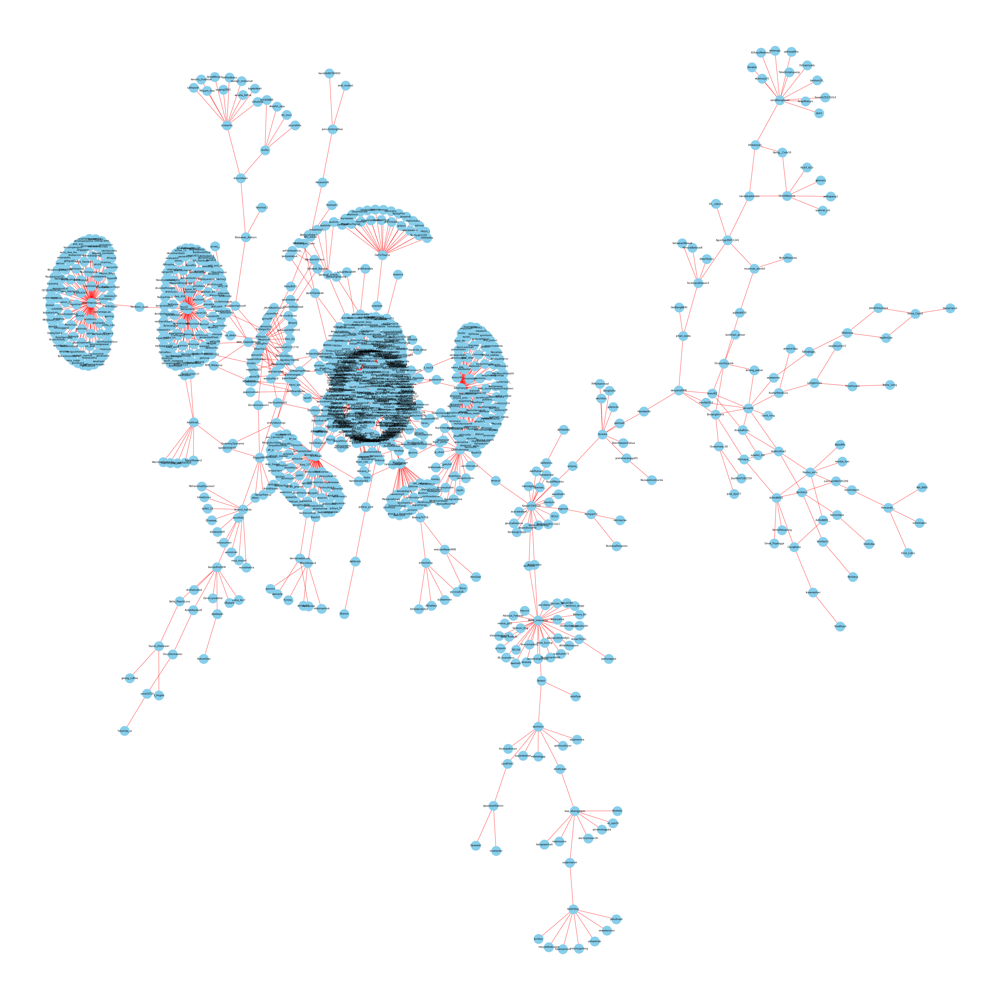

In [ ]:
# Contstruct a Network
G1 = nx.from_pandas_edgelist(df_tweets)

# Visualize the Network
import matplotlib.pyplot as plt
plt.figure(figsize=(50,50))
nx.draw(G1, with_labels=True, 
        node_color='skyblue', node_size=1200, 
        arrowstyle='->',arrowsize=20, edge_color='r',
        font_size=9,
        pos=nx.kamada_kawai_layout(G1))

### **Network Metrics and Measurement**

**Centrality Measurement**

In graph theory and network analysis, indicators of centrality identify the most important vertices within a graph. Applications include identifying the most influential person(s) in a social network, key infrastructure nodes in the Internet or urban networks, and super-spreaders of disease. Centrality concepts were first developed in social network analysis, and many of the terms used to measure centrality reflect their sociological origin.

In [ ]:
# Degree Centrality
degree = nx.degree_centrality(G1)

# Sorted from the Highest
sorted(nx.degree(G1), key=lambda x: x[1], reverse=True)[0:10]

[('KKMPutrajaya', 117),
 ('recehtapisayng', 93),
 ('berlianidris', 93),
 ('iqbalnasyat', 76),
 ('501Awani', 58),
 ('CNNIndonesia', 32),
 ('BNPB_Indonesia', 30),
 ('f4izalhassan', 24),
 ('OwToTheZie', 23),
 ('KawalCOVID19', 20)]

In [ ]:
# Betweenness Centrality
betweenness = nx.betweenness_centrality(G1)

# Sorted from the Highest
sorted(nx.betweenness_centrality(G1, normalized=True).items(), key=lambda x:x[1], reverse=True)[0:10]

[('berlianidris', 0.08282647381341726),
 ('KawalCOVID19', 0.07632109155343748),
 ('CNNIndonesia', 0.07630022272728998),
 ('MaspiyuO', 0.0723003643823519),
 ('marSyaheedAS', 0.07210716964332033),
 ('DonAdam68', 0.0710159829912743),
 ('kompascom', 0.07063402023390793),
 ('Putra_AmienJ', 0.06965255301630426),
 ('AryoPandu95', 0.0692275878293006),
 ('revacul', 0.06542313758374407)]

In [ ]:
# Closeness Centrality
closeness = nx.closeness_centrality(G1)

# Sorted from the Highest
sorted(nx.closeness_centrality(G1).items(), key=lambda x:x[1], reverse=True)[0:10]

[('KKMPutrajaya', 0.11650269612888828),
 ('pmrnabawan', 0.09959625836506822),
 ('along_wan10', 0.09483257550261145),
 ('rhnaaaaa', 0.09449777382387319),
 ('_hennyn', 0.09416532782976986),
 ('asysyaasysya', 0.09416532782976986),
 ('501Awani', 0.08754372669047288),
 ('izzathelmii', 0.08754372669047288),
 ('ieka93', 0.08754372669047288),
 ('f4izalhassan', 0.08697479914090035)]

In [ ]:
# Eigenvector Centrality
eigenvector = nx.eigenvector_centrality_numpy(G1)

# Sorted from the Highest
sorted(nx.eigenvector_centrality_numpy(G1).items(), key=lambda x:x[1], reverse=True)[0:10]

[('KKMPutrajaya', 0.7043631141046837),
 ('pmrnabawan', 0.07338735584121918),
 ('along_wan10', 0.07007498413290389),
 ('_hennyn', 0.06946831454010828),
 ('asysyaasysya', 0.06946831454010827),
 ('PMRMiri', 0.06742109017189356),
 ('rhnaaaaa', 0.06656586231431091),
 ('ieka93', 0.06642157656031823),
 ('izzathelmii', 0.06642157656031822),
 ('_pinkypanda_', 0.06624901609488426)]

***Visualize Centrality Score with Scatter Plot***

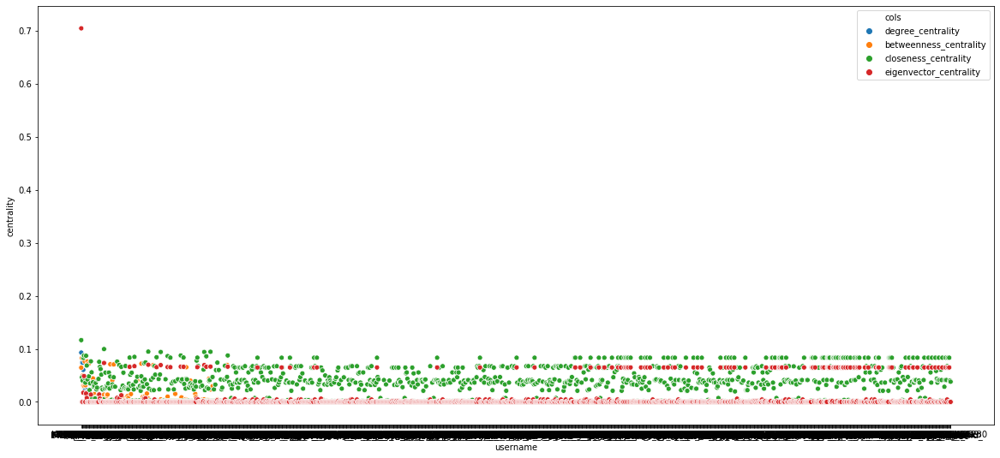

In [ ]:
# Convert Centralities to Data Frame
df_degree = pd.Series(degree).to_frame('degree_centrality')
df_betweenness = pd.Series(betweenness).to_frame('betweenness_centrality')
df_closeness = pd.Series(closeness).to_frame('closeness_centrality')
df_eigenvector = pd.Series(eigenvector).to_frame('eigenvector_centrality')

# Join Centralities Data Frame
df_centrality = pd.concat([df_degree, df_betweenness, df_closeness, df_eigenvector], axis = 1)
df_centrality['username'] = df_centrality.index
df_centrality = df_centrality.reset_index(drop = True)
df_centrality = df_centrality.sort_values(by=['degree_centrality'], ascending = False)
df_centrality = df_centrality.melt('username', var_name='cols',  value_name='centrality')
df_centrality

# Visualize Scatter Plot
plt.figure(figsize=(20,9))
sns.scatterplot(x='username', y='centrality', hue='cols', data=df_centrality)

***Visualize Network based on Centrality Measurement***

/usr/local/lib/python3.6/dist-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


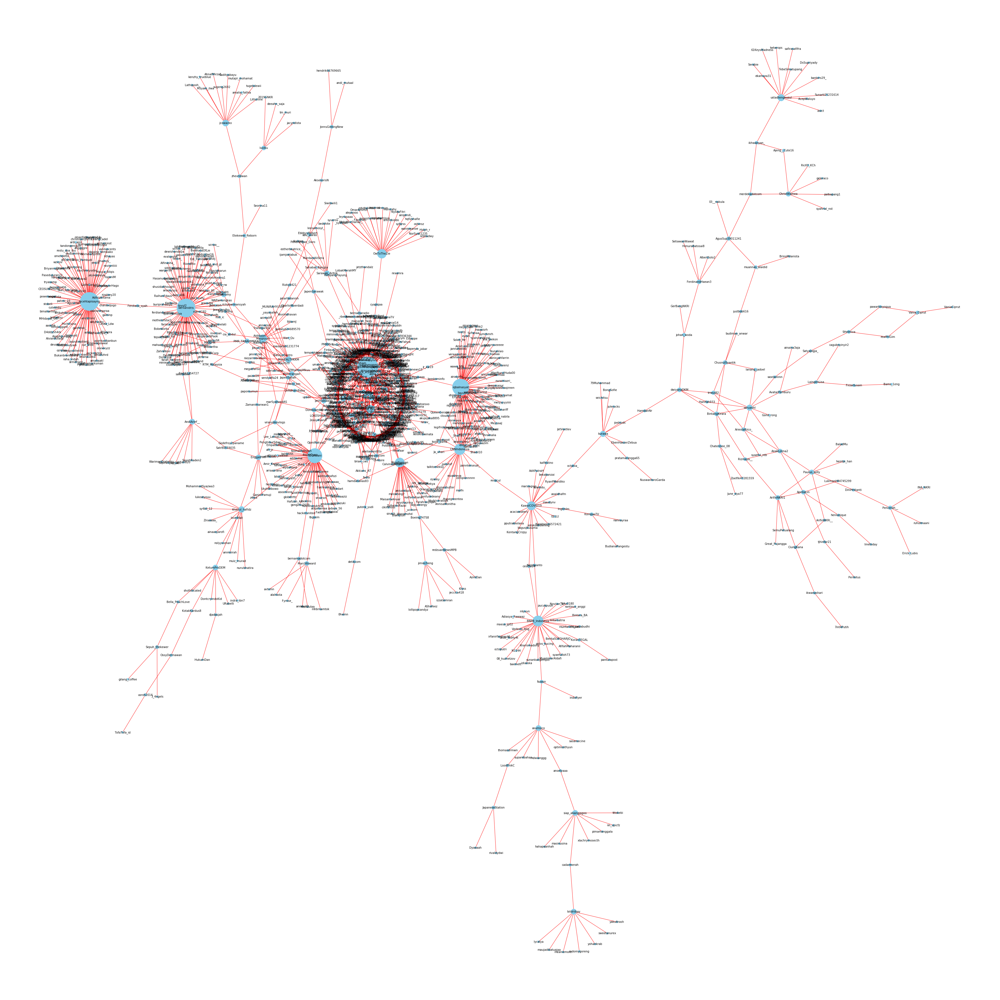

In [ ]:
# Set Degree Dictionary
d = dict(degree)

# Contstruct a Network
G1 = nx.from_pandas_edgelist(df_tweets)

# Visualize the Network
import matplotlib.pyplot as plt
plt.figure(figsize=(50,50))
nx.draw(G1, with_labels=True, 
        node_color='skyblue', nodelist=d.keys(),
        node_size=[v * 60000 for v in d.values()], 
        arrowstyle='->',arrowsize=20, edge_color='r',
        font_size=10,
        pos=nx.kamada_kawai_layout(G1))

**Network Topology Measurement**

The configuration, or topology, of a network is key to determining its performance. Network topology is the way a network is arranged, including the physical or logical description of how links and nodes are set up to relate to each other.

In [ ]:
# Show Number of Nodes
nx.number_of_nodes(G1)

1259

In [ ]:
# Show Number of Edges
nx.number_of_edges(G1)

1145

In [ ]:
# Show Graph Density
nx.density(G1)

0.0014458695484719875

In [ ]:
# Show Number of Connected Component
nx.number_connected_components(G1)

155

### **Community Detection**

Community detection is a fundamental problem in social network analysis consisting, roughly speaking, in dividing social actors (modelled as nodes in a social graph) with certain social connections (modelled as edges in the social graph) into densely knitted and highly related groups with each group well separated from different group members.

**Modularity Community**

In [ ]:
# Import Module
from networkx.algorithms.community import greedy_modularity_communities

# Modularity Community Detection
communities_m = sorted(greedy_modularity_communities(G1), key=len, reverse=True)
communities_m

[frozenset({'4hhyunjin',
            'AfafMiranda',
            'AfiqMuin',
            'AliImranHakim',
            'Azminnaaaa',
            'BernamaTV',
            'Chua77805335',
            'CikManisDonut',
            'DygNrarifqah',
            'FarhanJamli5229',
            'FirdausZali95',
            'JaPenWPKL',
            'JapenSarawak',
            'KKMPutrajaya',
            'KetipangPayung',
            'LobakMerahMY',
            'M_FitriRamli',
            'MariYan97836344',
            'MedicineMsia',
            'Modkai2',
            'Naddy_farah',
            'NeymAnem',
            'NnQeu',
            'PMRMiri',
            'Penerangan_Daro',
            'Rasyidir',
            'Safwnsmt',
            'ShazrifHisham',
            'ShouldNotBlank',
            'SuryaAfila',
            'SyafiqJai',
            'SyamiraYahya',
            'TMalaysiaPost',
            'Wahidafesool',
            '_Aziiiiiimah',
            '__hzwani',
            '_iisyafiqah_',
 

In [ ]:
# Set Node Community Function
def set_node_community(G1, communities_m):
      '''Add community to node attributes'''
      for c, v_c in enumerate(communities_m):
        for v in v_c:
          # Add 1 to save 0 for external edges
          G1.nodes[v]['community'] = c + 1      

In [ ]:
# Set Colour Function
def get_color(i, r_off=1, g_off=1, b_off=1):
     '''Assign a color to a vertex.'''
     r0, g0, b0 = 0, 0, 0
     n = 16
     low, high = 0.1, 0.9
     span = high - low
     r = low + span * (((i + r_off) * 3) % n) / (n - 1)
     g = low + span * (((i + g_off) * 5) % n) / (n - 1)
     b = low + span * (((i + b_off) * 7) % n) / (n - 1)
     return (r, g, b) 

/usr/local/lib/python3.6/dist-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


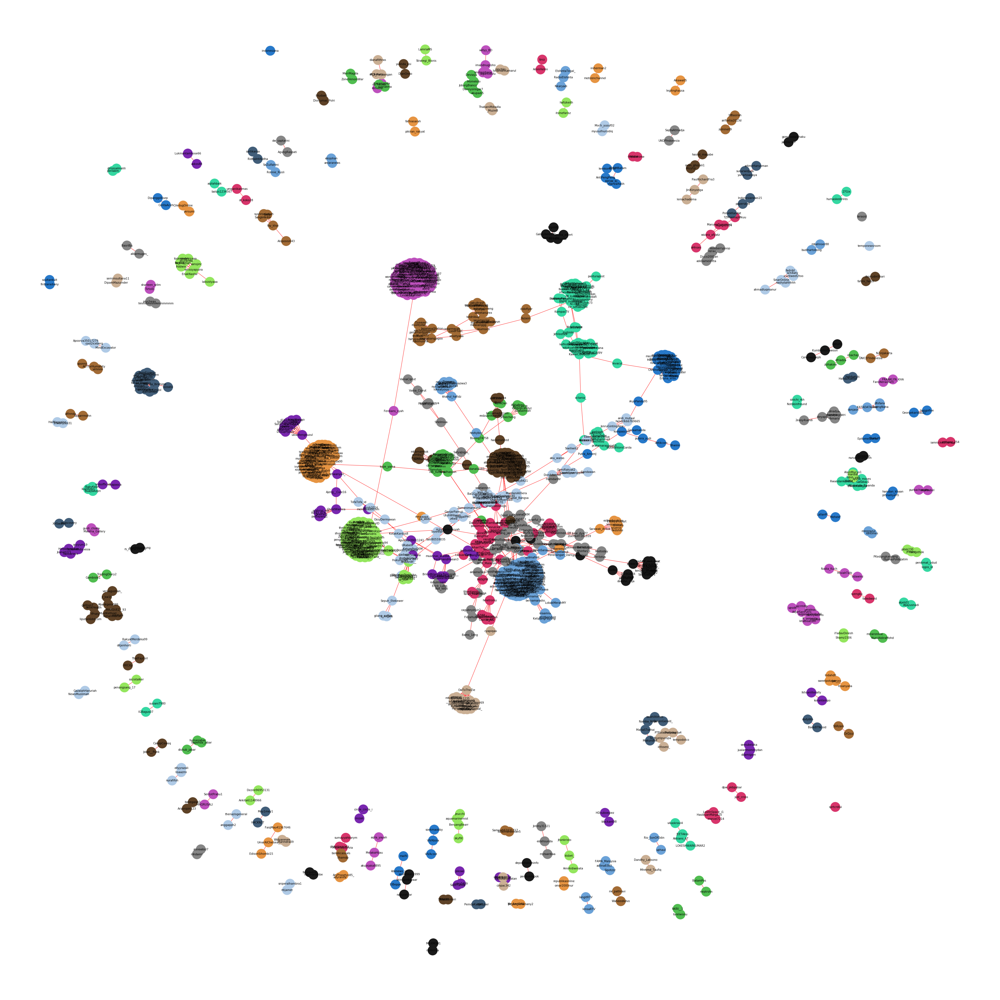

In [ ]:
# Set Node Communities
community = set_node_community(G1, communities_m)

# Set Node Color
node_color = [get_color(G1.nodes[v]['community']) for v in G1.nodes]

# Visualize the Network
import matplotlib.pyplot as plt
plt.figure(figsize=(50,50))
nx.draw(G1, with_labels=True, 
        node_color = node_color, node_size=1200, 
        arrowstyle='->',arrowsize=20, edge_color='r',
        font_size=10)


**Another Ways to Visualize Network**

In [ ]:
! pip install nxviz

Arcplot

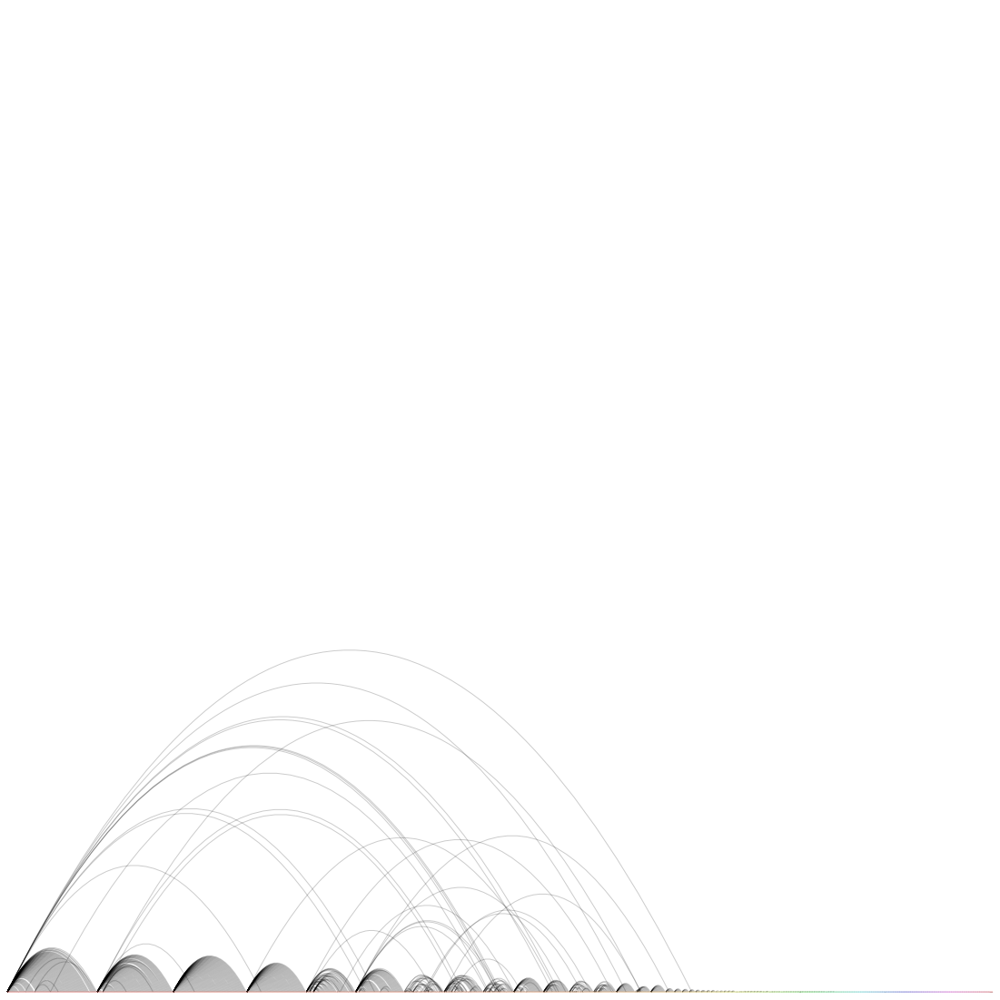

In [ ]:
# Import Module
from nxviz import ArcPlot

# Visualize the Network
arcplot = ArcPlot(G1, node_color='community', node_orders='community', node_grouping='community',
                  figsize=(20, 20), group_label_position="middle", nodeprops={"radius": 2},
                  fontsize=12, fontfamily="fantasy")
arcplot.draw()
plt.show()

Circosplot

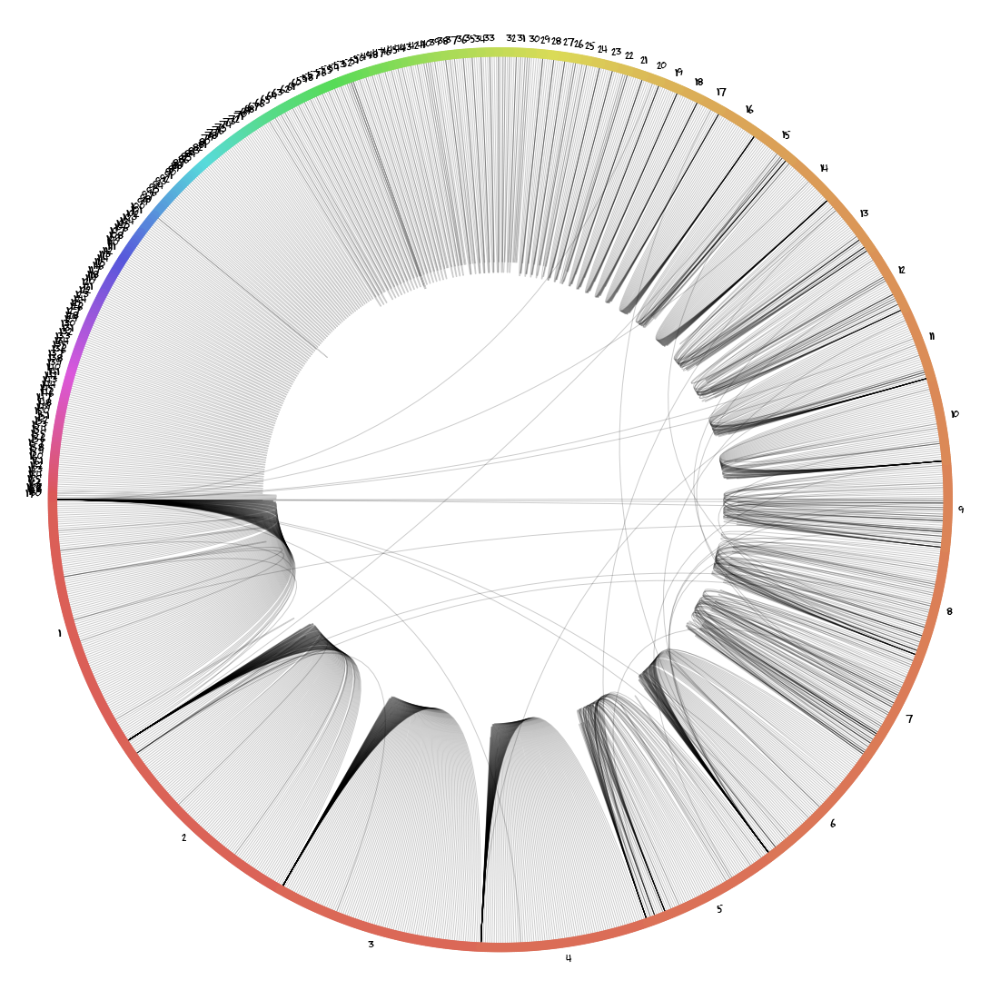

In [ ]:
# Import Module
from nxviz import CircosPlot

# Visualize the Network
circosplot = CircosPlot(G1,
                        node_color='community', node_orders='community', node_grouping='community',
                        figsize=(20, 20), group_label_position="middle", nodeprops={"radius": 2},
                        fontsize=12, fontfamily="fantasy")
circosplot.draw()
plt.show()

## **C. Social Network Analysis: Vaksin**

### **Network Construction**

Here we construct a social network based on conversations about covid on Twitter.

**Import Edge List Data**

In [ ]:
# Import Data
df_tweets = pd.read_csv('https://raw.githubusercontent.com/machine-learning-ss/dataset/master/edgelist_vaksin.csv', sep=',')

# Show Data
df_tweets

,source,target
0,RakyatMerdeka99,Andespen1
1,RakyatMerdeka99,Andespen1
2,RakyatMerdeka99,Andespen1
3,RakyatMerdeka99,Andespen1
4,Kanseulir,Xander4c3
...,...,...
1098,fxmario,ABtaher
1099,MARQUEZ__93,rolando7778
1100,drpriono,rumahaksara
1101,novablyze,balakehidupan


**Visualize the Network**

/usr/local/lib/python3.6/dist-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


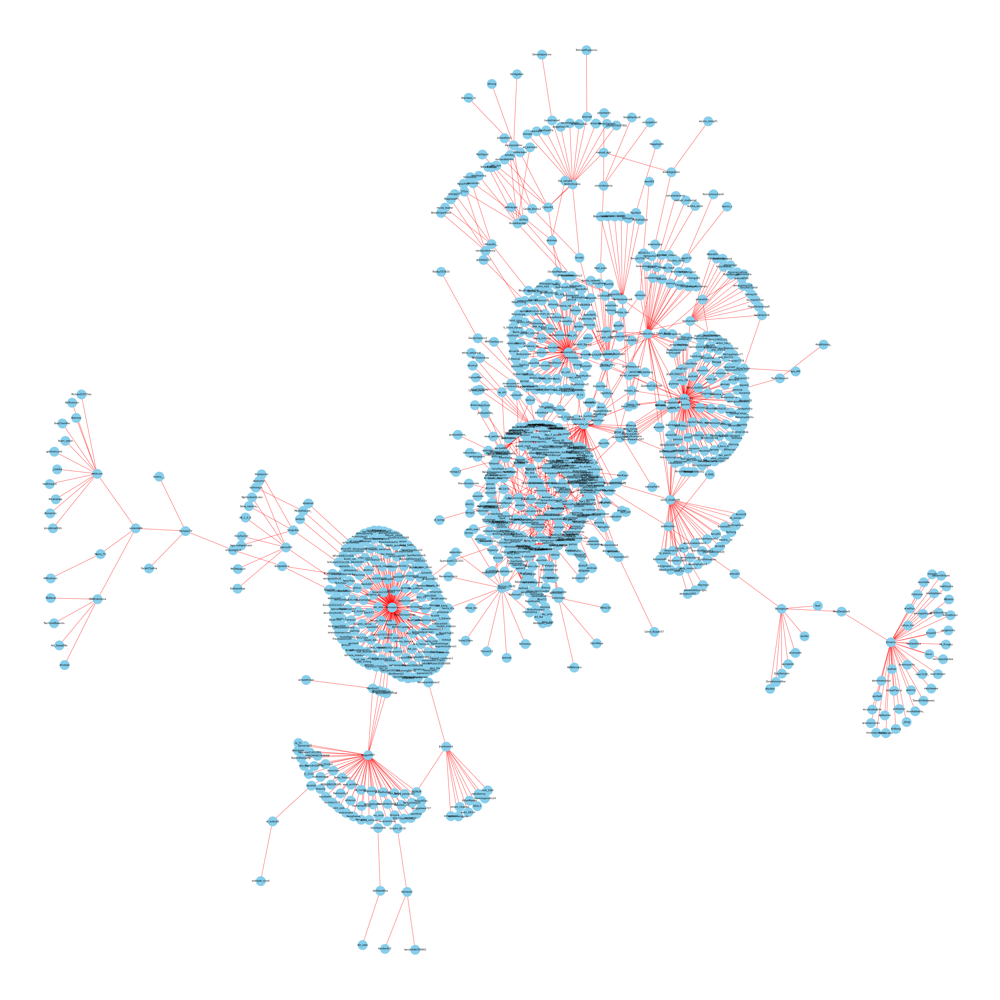

In [ ]:
# Contstruct a Network
G1 = nx.from_pandas_edgelist(df_tweets)

# Visualize the Network
import matplotlib.pyplot as plt
plt.figure(figsize=(50,50))
nx.draw(G1, with_labels=True, 
        node_color='skyblue', node_size=1200, 
        arrowstyle='->',arrowsize=20, edge_color='r',
        font_size=9,
        pos=nx.kamada_kawai_layout(G1))

### **Network Metrics and Measurement**

**Centrality Measurement**

In [ ]:
# Degree Centrality
degree = nx.degree_centrality(G1)

# Sorted from the Highest
sorted(nx.degree(G1), key=lambda x: x[1], reverse=True)[0:10]

[('fahiraidris', 172),
 ('MARQUEZ__93', 110),
 ('dwiyanaDKM', 89),
 ('EnggalPMT', 51),
 ('Penyuka_ombak', 46),
 ('AnakLolina2', 39),
 ('fxmario', 38),
 ('LOVE_AG4EVER', 34),
 ('Paulus_willy', 20),
 ('TarunaIkrar', 20)]

In [ ]:
# Betweenness Centrality
betweenness = nx.betweenness_centrality(G1)

# Sorted from the Highest
sorted(nx.betweenness_centrality(G1, normalized=True).items(), key=lambda x:x[1], reverse=True)[0:10]

[('fahiraidris', 0.27283845511824417),
 ('Penyuka_ombak', 0.2714401045461402),
 ('TarunaIkrar', 0.22772805504866434),
 ('Mysoul03559460', 0.219311523723345),
 ('Syamsud41732201', 0.2138922944916211),
 ('dwiyanaDKM', 0.12788741163307613),
 ('MARQUEZ__93', 0.12691518339720176),
 ('EnggalPMT', 0.06396011848709898),
 ('spektrumku', 0.05892586431732062),
 ('AntonErl', 0.05432108264157318)]

In [ ]:
# Closeness Centrality
closeness = nx.closeness_centrality(G1)

# Sorted from the Highest
sorted(nx.closeness_centrality(G1).items(), key=lambda x:x[1], reverse=True)[0:10]

[('Penyuka_ombak', 0.16085506788386056),
 ('Mysoul03559460', 0.15384624076036726),
 ('TarunaIkrar', 0.1473354350697095),
 ('dwiyanaDKM', 0.14603884866545863),
 ('Nitizen_Zen', 0.14220120968310437),
 ('Daeng_ime', 0.14083350356451158),
 ('becak125cc', 0.1398837974432561),
 ('Syamsud41732201', 0.1398445042417271),
 ('Paulus_willy', 0.13964836889215945),
 ('reng_kenek', 0.13856009883121304)]

In [ ]:
# Eigenvector Centrality
eigenvector = nx.eigenvector_centrality_numpy(G1)

# Sorted from the Highest
sorted(nx.eigenvector_centrality_numpy(G1).items(), key=lambda x:x[1], reverse=True)[0:10]

[('fahiraidris', 0.7065659432562131),
 ('Masdjodi1', 0.05595075457570619),
 ('NurulAi14459911', 0.05562584607137333),
 ('uwaydugan', 0.05562584607137331),
 ('himura89517038', 0.0556258460713733),
 ('EggySari', 0.05447957444061187),
 ('fIcal85360324', 0.05447957444061185),
 ('Syamsud41732201', 0.0541968998141647),
 ('HeriawanAdiwan2', 0.054188189526454884),
 ('wongsolo0904', 0.05416904373198746)]

***Visualize Centrality Score with Scatter Plot***

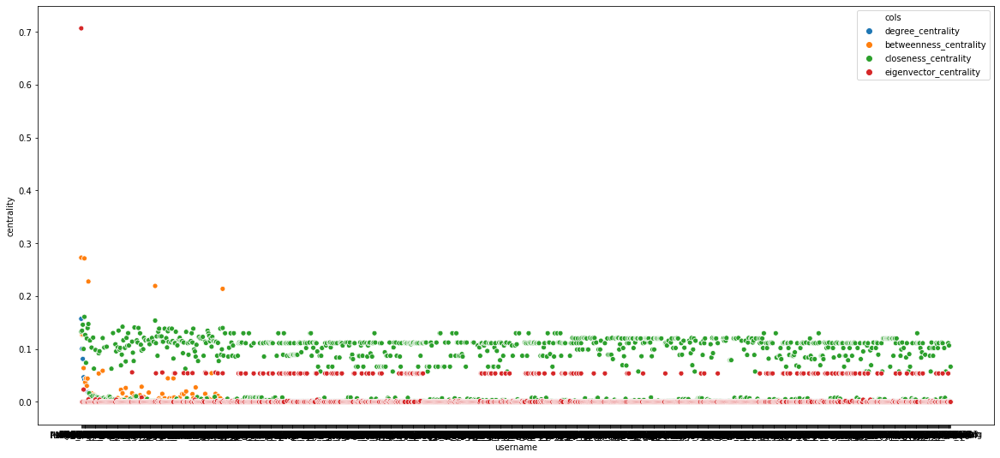

In [ ]:
# Convert Centralities to Data Frame
df_degree = pd.Series(degree).to_frame('degree_centrality')
df_betweenness = pd.Series(betweenness).to_frame('betweenness_centrality')
df_closeness = pd.Series(closeness).to_frame('closeness_centrality')
df_eigenvector = pd.Series(eigenvector).to_frame('eigenvector_centrality')

# Join Centralities Data Frame
df_centrality = pd.concat([df_degree, df_betweenness, df_closeness, df_eigenvector], axis = 1)
df_centrality['username'] = df_centrality.index
df_centrality = df_centrality.reset_index(drop = True)
df_centrality = df_centrality.sort_values(by=['degree_centrality'], ascending = False)
df_centrality = df_centrality.melt('username', var_name='cols',  value_name='centrality')
df_centrality

# Visualize Scatter Plot
plt.figure(figsize=(20,9))
sns.scatterplot(x='username', y='centrality', hue='cols', data=df_centrality)

***Visualize Network based on Centrality Measurement***

/usr/local/lib/python3.6/dist-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


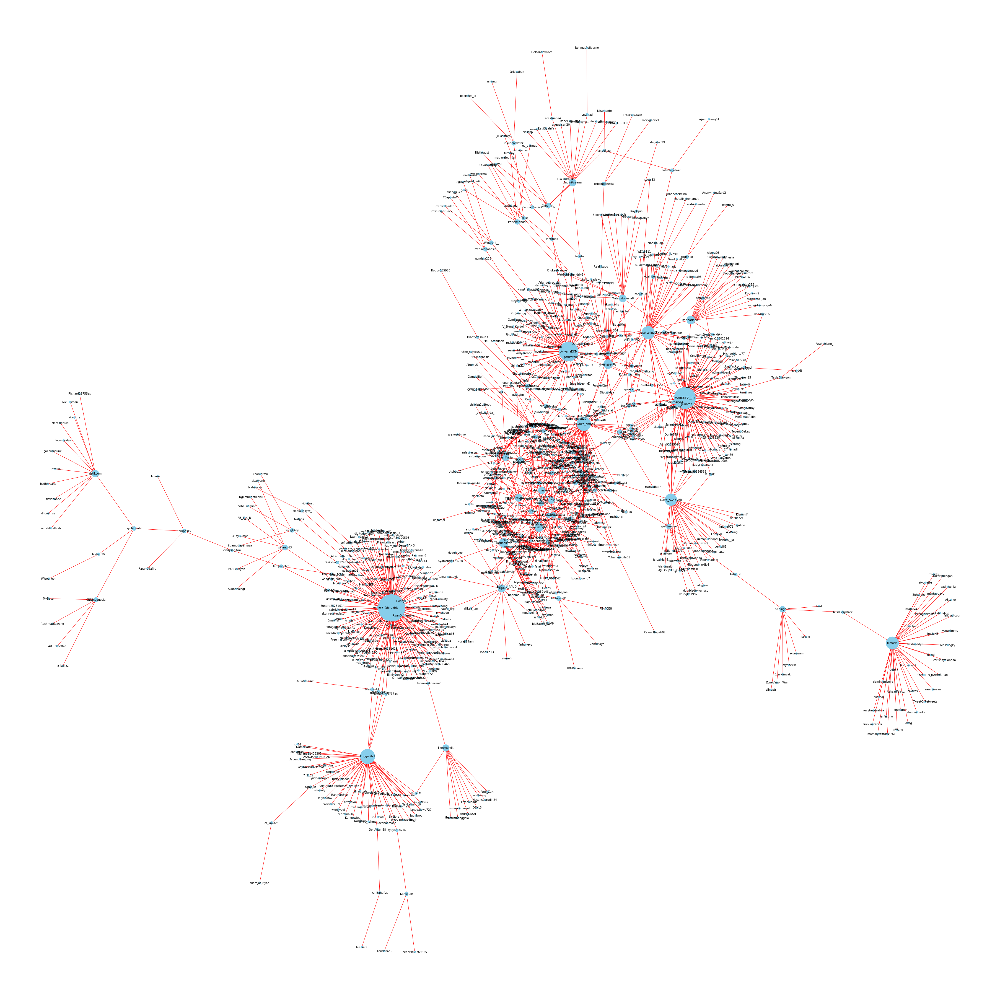

In [ ]:
# Set Degree Dictionary
d = dict(degree)

# Contstruct a Network
G1 = nx.from_pandas_edgelist(df_tweets)

# Visualize the Network
import matplotlib.pyplot as plt
plt.figure(figsize=(50,50))
nx.draw(G1, with_labels=True, 
        node_color='skyblue', nodelist=d.keys(),
        node_size=[v * 60000 for v in d.values()], 
        arrowstyle='->',arrowsize=20, edge_color='r',
        font_size=10,
        pos=nx.kamada_kawai_layout(G1))

**Network Topology Measurement**

In [ ]:
# Show Number of Nodes
nx.number_of_nodes(G1)

1095

In [ ]:
# Show Number of Edges
nx.number_of_edges(G1)

1071

In [ ]:
# Show Graph Density
nx.density(G1)

0.0017880844456687787

In [ ]:
# Show Number of Connected Component
nx.number_connected_components(G1)

88

### **Community Detection**

**Modularity Community**

In [ ]:
# Import Module
from networkx.algorithms.community import greedy_modularity_communities

# Modularity Community Detection
communities_m = sorted(greedy_modularity_communities(G1), key=len, reverse=True)
communities_m

[frozenset({'11brantakan',
            'ANesta33846198',
            'ARr123ee',
            'AbolichdZ',
            'AciakN',
            'Adzkia77075950',
            'AlFatih68231928',
            'Alie_Fahnoor',
            'AmstrongBiring',
            'Bagas36406270',
            'BruNet_tes',
            'BundaRiena3',
            'ButterCupdanie1',
            'BuyungRifansya3',
            'ChengHo48078612',
            'ChristWamea',
            'Coontadee',
            'Diazd1802',
            'DoesDeep',
            'EgaAndimega',
            'EggySari',
            'ElMubar26384689',
            'ElfianSKM',
            'ElinMoenik2',
            'EmakYuni',
            'Firmanpaytren3',
            'FreemasonryID',
            'Gak_NyerahBRO',
            'GreatSpiderman7',
            'GustiR34100598',
            'Hafizh05',
            'HasbyYusuf9',
            'Kayra40683526',
            'Kelana_M5',
            'LiaEmza',
            'MRachmat_',
            'MasA

In [ ]:
# Set Node Community Function
def set_node_community(G1, communities_m):
      '''Add community to node attributes'''
      for c, v_c in enumerate(communities_m):
        for v in v_c:
          # Add 1 to save 0 for external edges
          G1.nodes[v]['community'] = c + 1      

In [ ]:
# Set Colour Function
def get_color(i, r_off=1, g_off=1, b_off=1):
     '''Assign a color to a vertex.'''
     r0, g0, b0 = 0, 0, 0
     n = 16
     low, high = 0.1, 0.9
     span = high - low
     r = low + span * (((i + r_off) * 3) % n) / (n - 1)
     g = low + span * (((i + g_off) * 5) % n) / (n - 1)
     b = low + span * (((i + b_off) * 7) % n) / (n - 1)
     return (r, g, b) 

/usr/local/lib/python3.6/dist-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


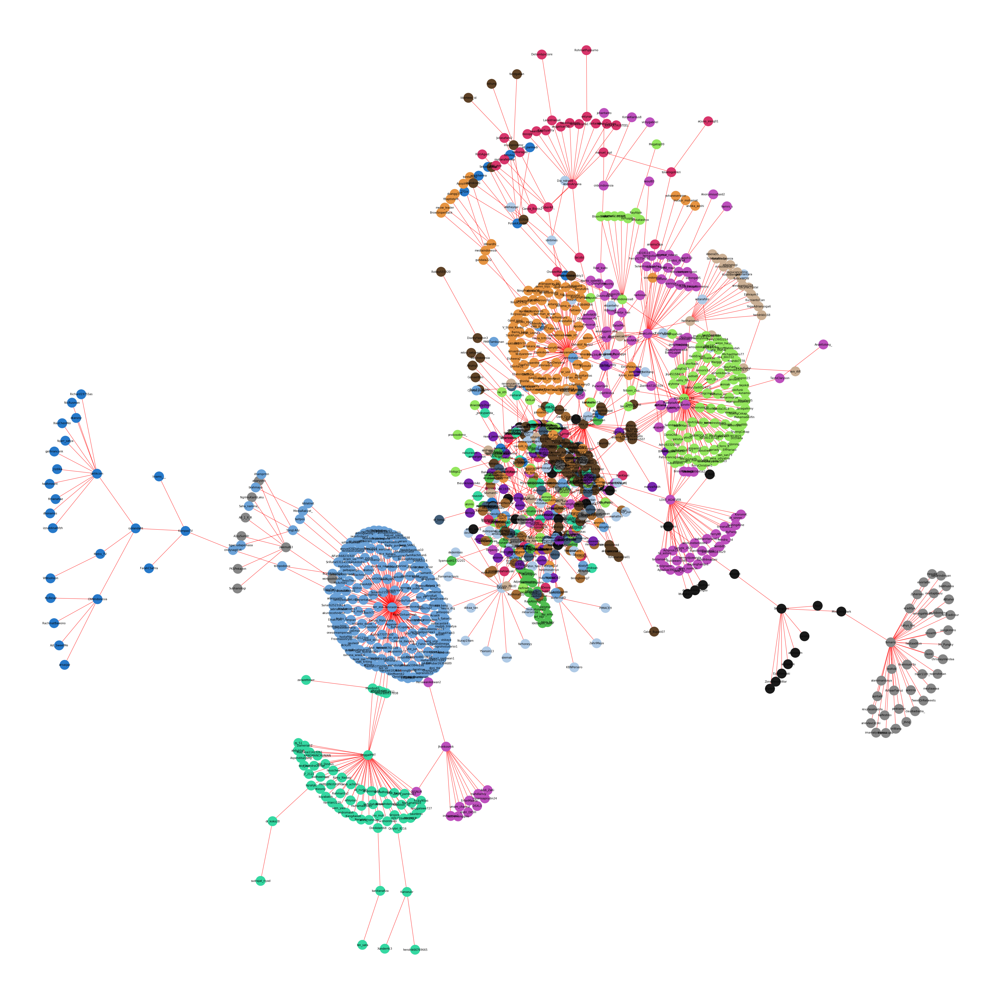

In [ ]:
# Set Node Communities
community = set_node_community(G1, communities_m)

# Set Node Color
node_color = [get_color(G1.nodes[v]['community']) for v in G1.nodes]

# Visualize the Network
import matplotlib.pyplot as plt
plt.figure(figsize=(50,50))
nx.draw(G1, with_labels=True, 
        node_color = node_color, node_size=1200, 
        arrowstyle='->',arrowsize=20, edge_color='r',
        font_size=10, pos=nx.kamada_kawai_layout(G1))



**Another Ways to Visualize Network**

Arcplot

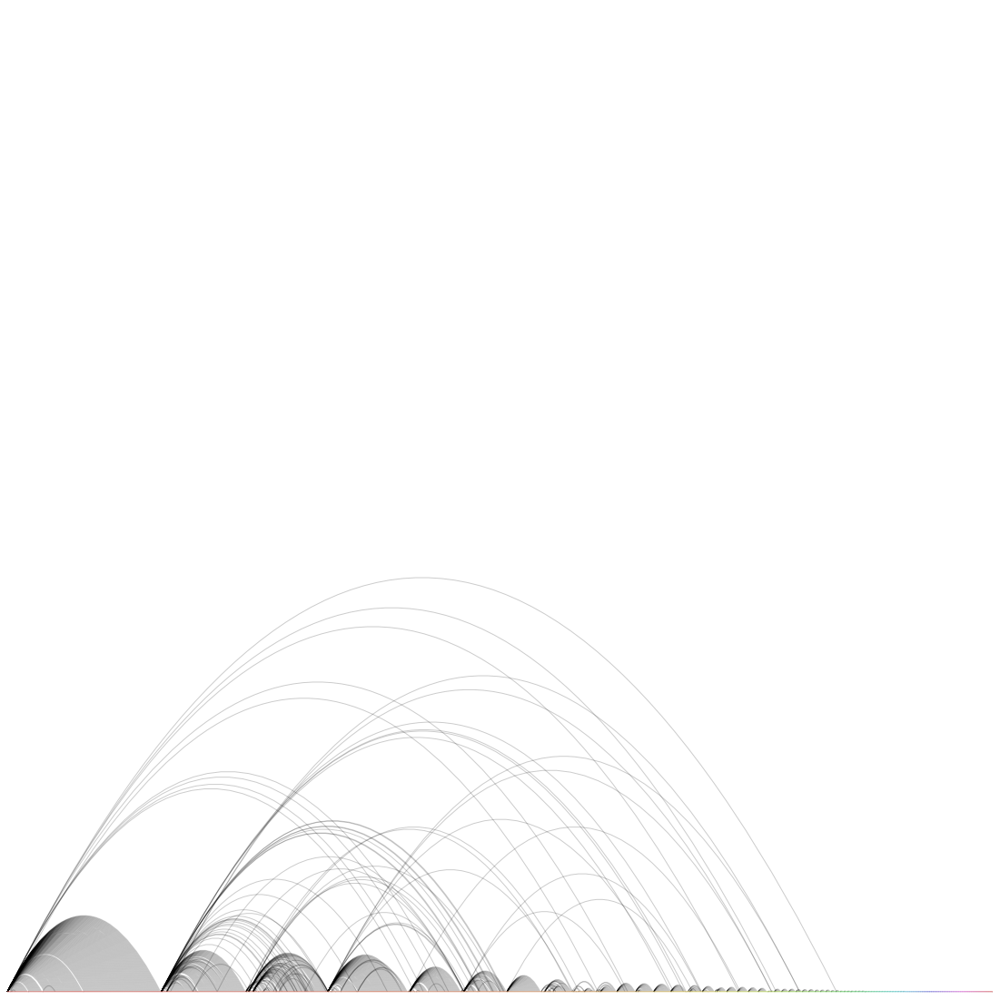

In [ ]:
# Import Module
from nxviz import ArcPlot

# Visualize the Network
arcplot = ArcPlot(G1, node_color='community', node_orders='community', node_grouping='community',
                  figsize=(20, 20), group_label_position="middle", nodeprops={"radius": 2},
                  fontsize=12, fontfamily="fantasy")
arcplot.draw()
plt.show()

Circosplot

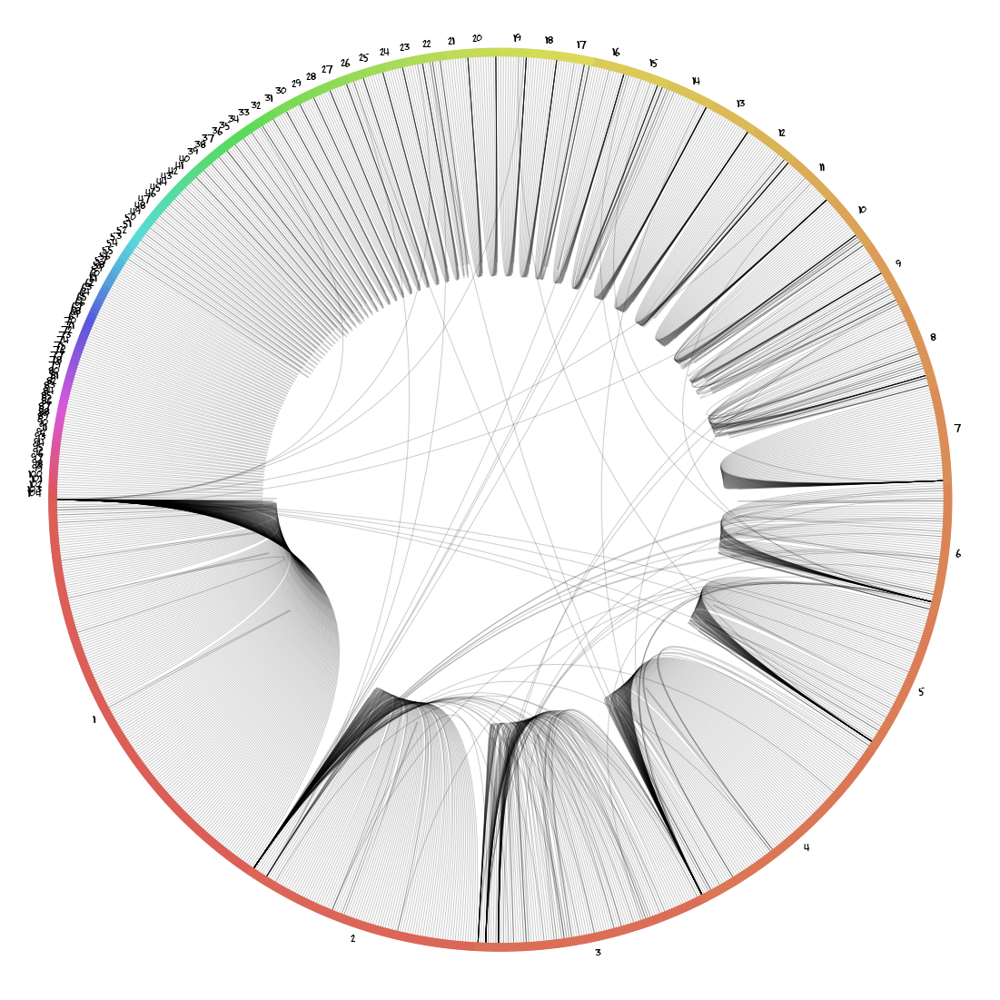

In [ ]:
# Import Module
from nxviz import CircosPlot

# Visualize the Network
circosplot = CircosPlot(G1,
                        node_color='community', node_orders='community', node_grouping='community',
                        figsize=(20, 20), group_label_position="middle", nodeprops={"radius": 2},
                        fontsize=12, fontfamily="fantasy")
circosplot.draw()
plt.show()